In [16]:
import sys
sys.path.append("./flask")

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from keras import backend as K
from random import randint
import inception_v4
import numpy as np
import cv2, scipy
import os, PIL
from PIL import Image
import tensorflow as tf
from tensorflow.python.platform import gfile
from model import get_keras_objects
import matplotlib.pyplot as plt
from plotly import offline as py, graph_objs as go
import cytoolz as cz

py.init_notebook_mode()

%matplotlib inline

size = 299
folder = "data/images2"

### Read images and calculate embeddings with inception v4

In [8]:
images = []
path_images = []
for name in os.listdir(folder):
    path = os.path.join(folder,name)
    im = Image.open(path)
    if not (im.mode == "RGB"):
        im = im.convert("RGB")
    if ( im.size[0] != size or im.size[1] != size): #reshape it
        im = im.resize((size, size,), PIL.Image.ANTIALIAS)
    images.append(np.array(im))
    path_images.append(path)
            
        
images =  np.stack(images)
#images.shape

sess, graph, image, embedding, keras_training = get_keras_objects()

embeddings = []
for img in images:
    pred = sess.run(embedding,{image: [img], keras_training:False })
    embeddings.append(np.squeeze(pred))
    
embeddings =  np.stack(embeddings)
embeddings.shape

(1337, 1536)

### Calculate T-SNE from embeddings and K-Means clustering

In [12]:
tsne = TSNE(n_components=3, perplexity=5.0, early_exaggeration=12.0, learning_rate=200.0, n_iter=5000, init="random")
tsne_embeddings = tsne.fit_transform(embeddings)

n_clusters = 10
kmeans = KMeans(n_clusters = n_clusters, random_state=0)
clusters = kmeans.fit_predict(embeddings)

### 3D-Graph from clusters

In [13]:
trace1 = go.Scatter3d(
    x=tsne_embeddings[:,0],
    y=tsne_embeddings[:,1],
    z=tsne_embeddings[:,2],
    mode='markers',
    marker=dict(
    size='16',
    color = clusters, #set color equal to a variable
    colorscale='Viridis',
    showscale=True
)
)
data = [trace1]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='simple-3d-scatter')

## Images from clusters

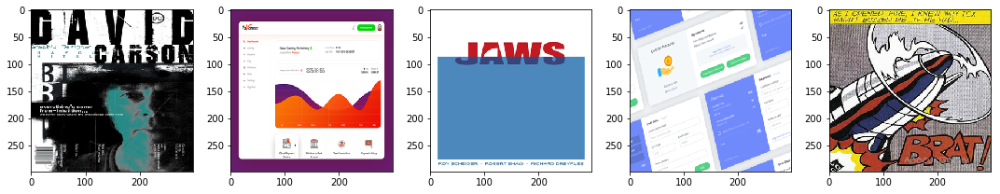

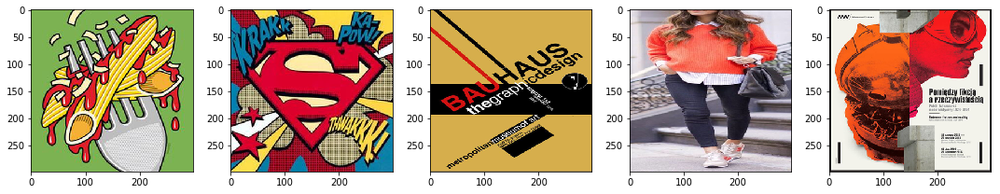

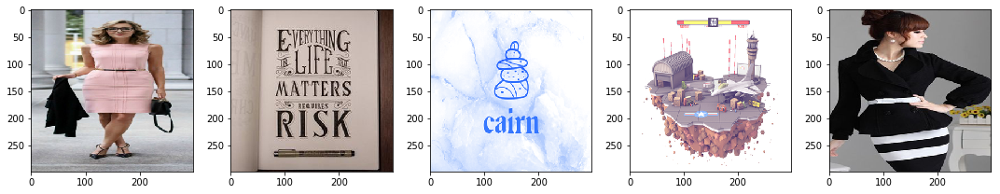

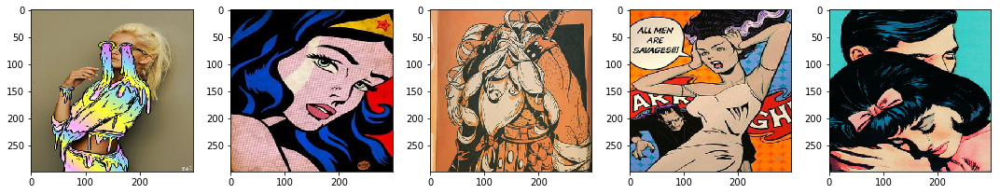

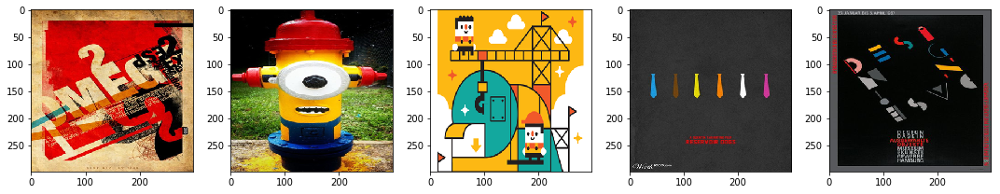

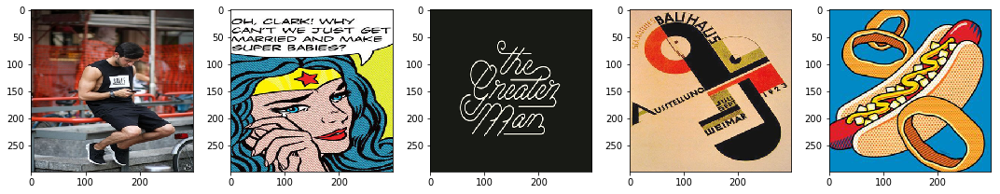

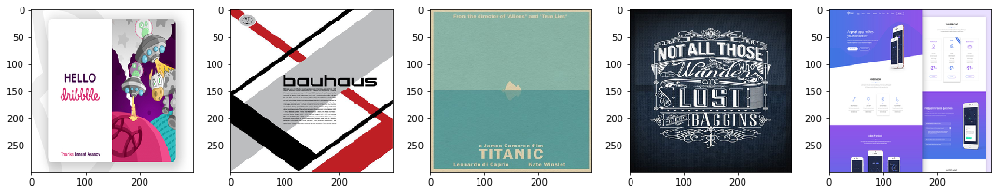

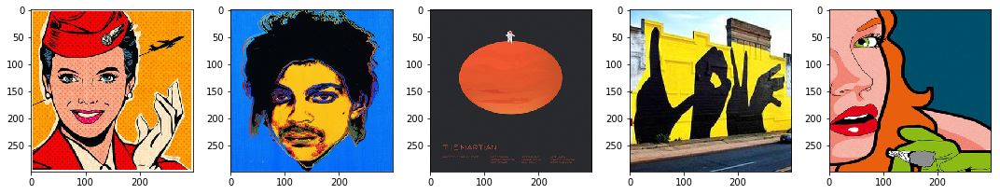

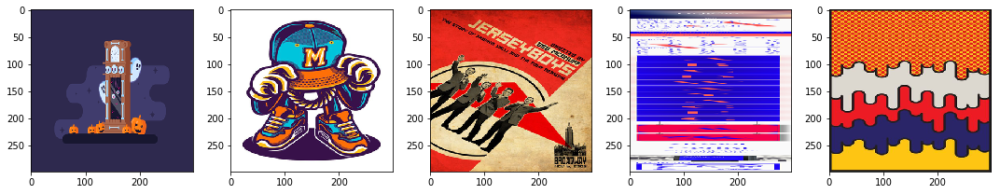

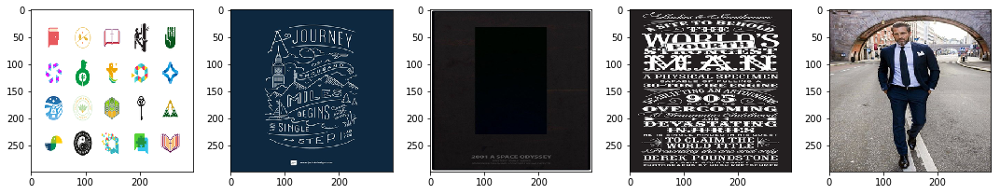

In [14]:
n_images = 5

for i in range(n_clusters):
    
    f, axs = plt.subplots(1, n_images, figsize=(15,15))
    
    for j, index in enumerate(cz.take(n_images, np.squeeze(np.argwhere(clusters==i)))):
        path = path_images[index]
        # print(index)
        im = Image.open(path)
        axs[j].imshow(features_test[index,:,:,:])
    
    f.tight_layout()
    plt.show()

### Closest images from random samples

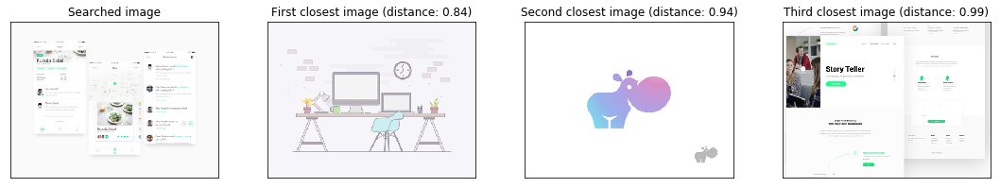

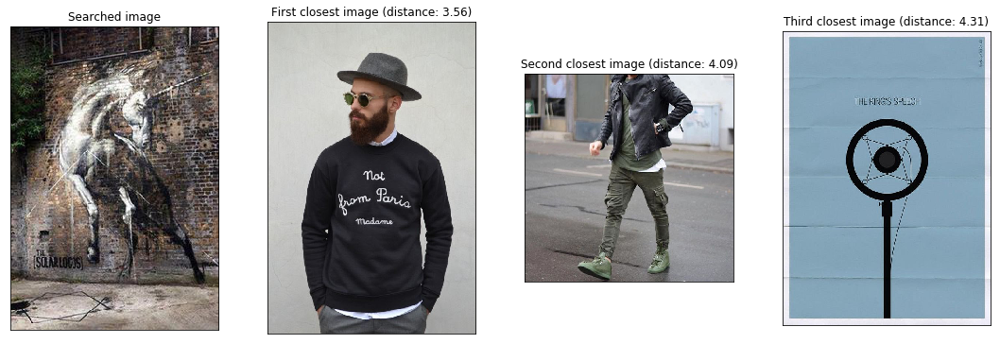

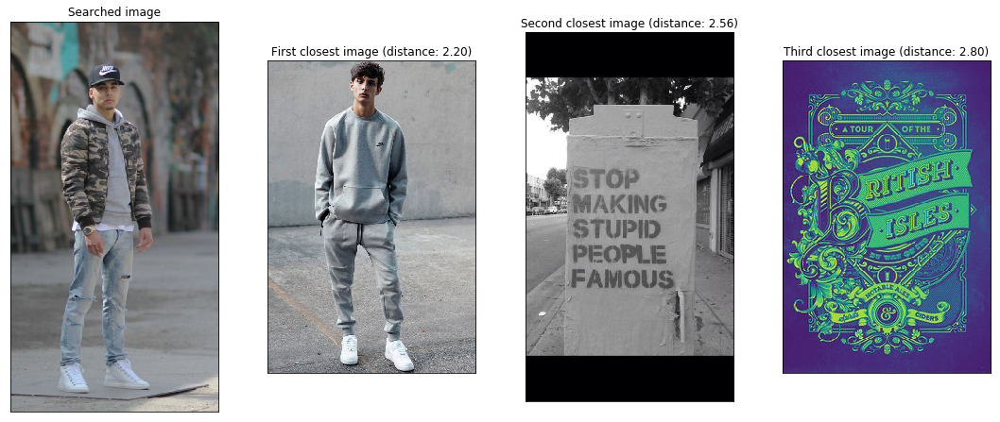

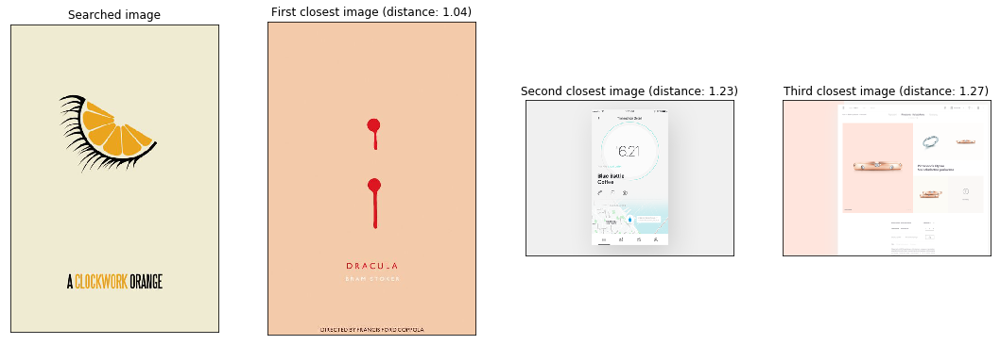

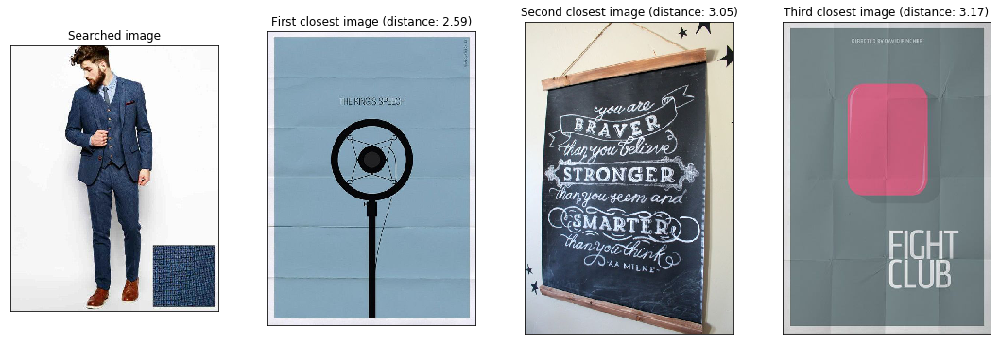

...

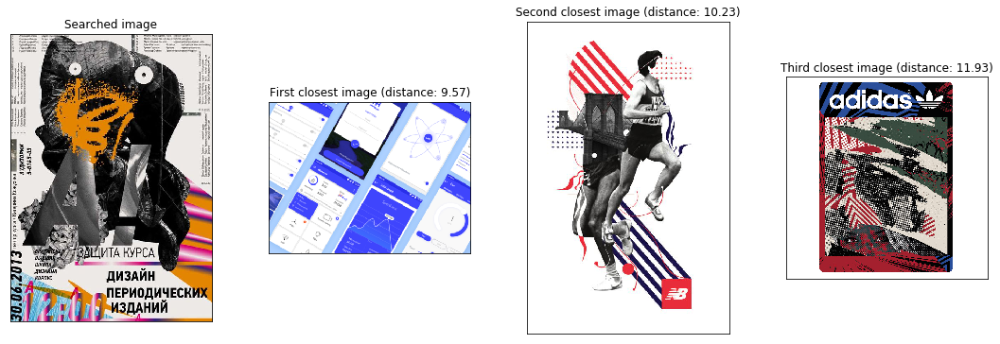

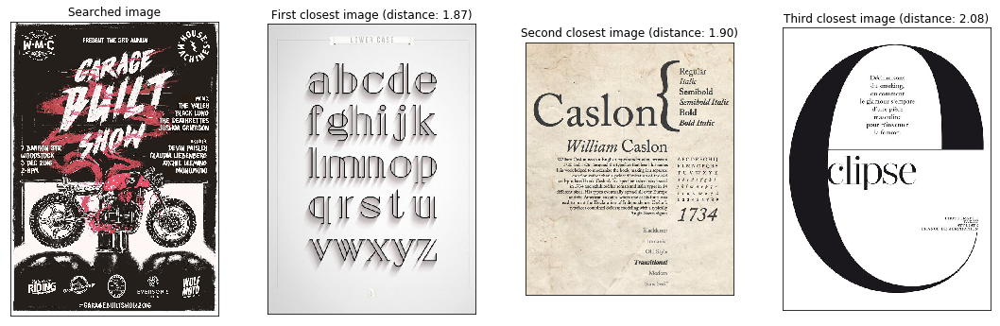

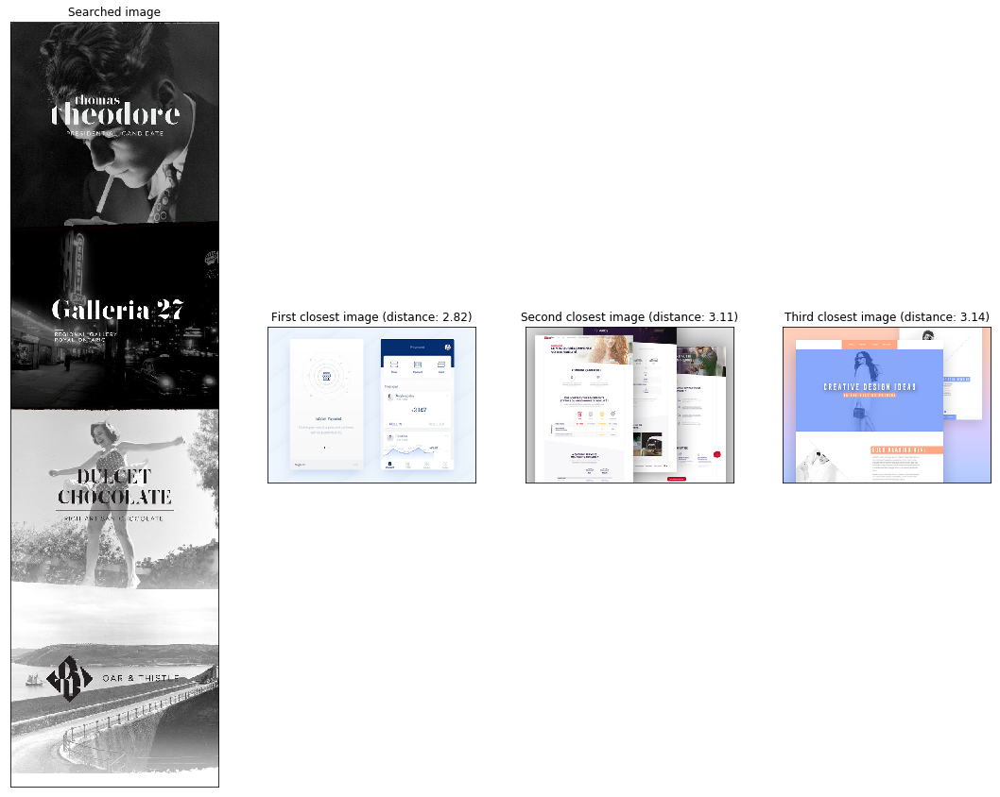

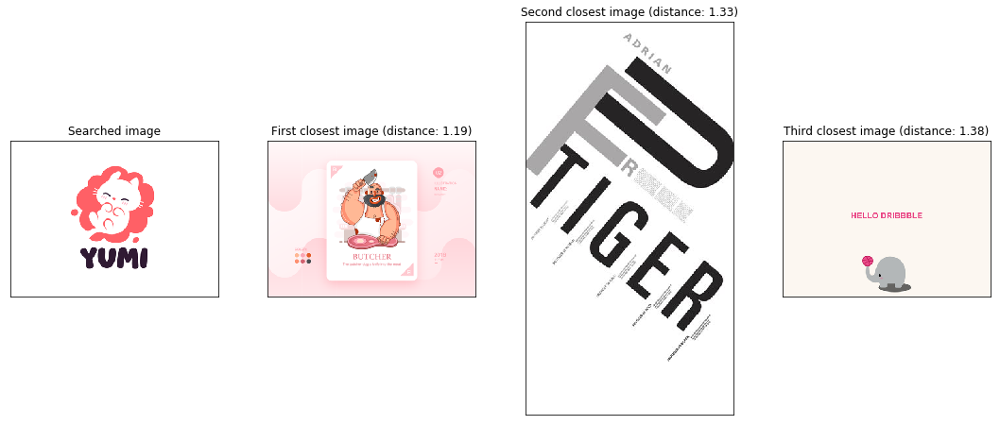

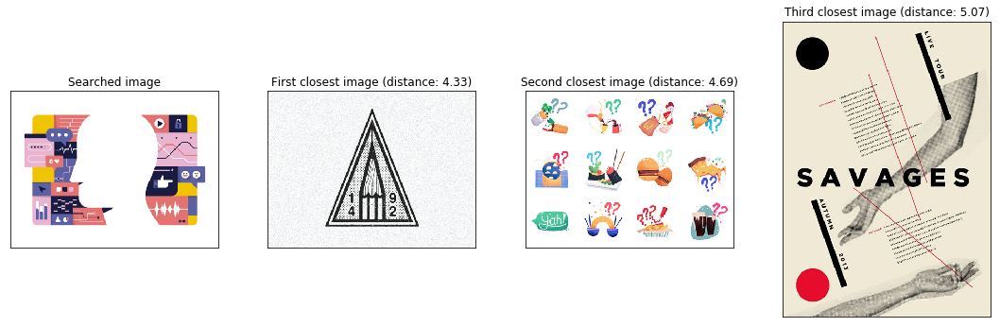

In [35]:
n_samples = 20
n_images = 4

titles = [" ", "First", "Second", "Third"]

for i in range(n_samples):
    
    f, axs = plt.subplots(1, n_images, figsize=(15,15))
    
    sample = randint(0, len(embeddings)-1)
    sample_image_reduced = embeddings[sample]

    distances = np.array((map(lambda x: scipy.spatial.distance.euclidean(x,sample_image_reduced), embeddings)))

    sort_index = np.argsort(distances)
    
    for j in range(n_images):
        if j == 0:
            title = "Searched image"
        else:
            title = "{} closest image ".format(titles[j]) + "(distance: {0:.2f})".format(distances[sort_index[j]])
        path = path_images[sort_index[j]]
      
        im = Image.open(path)
        fig = axs[j].imshow(np.asarray(im))
        axs[j].set_title(title)
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)
        
    
    f.tight_layout()
    plt.show()